#               TERM DEPOSIT SUBSCRIPTION PREDICTON

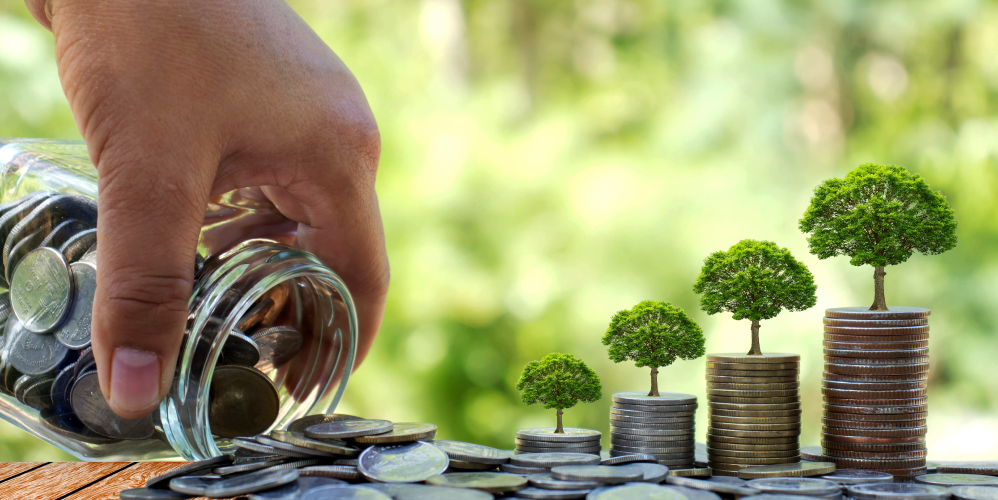

# PROBLEM STATEMENT : 

## To address the challenges of banking telecallers when they call blindly to people in order to sell term deposit plans. The aim here is to find the most accurate prediction of whether a person to be called will subscribe to the term deposit plan or not using any of the machine learning algorithms.  Historical data can be used which consists of different features of customers and whether they subscribed to the plan or not. Using this data, the participants need to build a machine learning model in order to make predictions

In [1]:
# Importing necessary basic packages
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt

In [2]:
df1 = pd.read_csv('train 2.csv')

In [3]:
dg = pd.read_csv('test2.csv')

In [4]:
df = df1.copy()

In [5]:
dg1 = dg.copy()

In [6]:
df1.shape

(21000, 17)

In [7]:
dg.shape

(9000, 16)

In [8]:
df1.describe()

,age,balance,day,duration,campaign,pdays,previous,y_bool
count,21000.000000,21000.000000,21000.000000,20948.000000,21000.000000,21000.000000,21000.000000,21000.000000
mean,36.997952,1607.497810,11.056571,263.981144,2.013381,3.231952,0.102524,0.269095
std,10.484725,2991.187132,7.450415,287.831246,1.575916,23.161489,0.664355,0.443500
min,19.000000,-2072.000000,1.000000,4.000000,1.000000,-1.000000,0.000000,0.000000
25%,29.000000,299.000000,5.000000,94.000000,1.000000,-1.000000,0.000000,0.000000
50%,35.000000,633.000000,10.000000,184.000000,2.000000,-1.000000,0.000000,0.000000
75%,45.000000,1875.000000,16.000000,319.000000,2.000000,-1.000000,0.000000,1.000000
max,87.000000,71188.000000,31.000000,2703.000000,28.000000,437.000000,14.000000,1.000000


In [9]:
df1.describe(include = 'object')

,job,marital,education,default,housing,loan,contact,month,poutcome
count,21000,21000,20963,21000,21000,21000,21000,21000,21000
unique,12,3,4,2,2,2,3,12,4
top,blue-collar,married,secondary,no,yes,no,cellular,jul,unknown
freq,4947,13412,10647,19994,11263,16215,13172,5011,16125


In [10]:
df1.sample(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y_bool
19304,31,technician,married,secondary,yes,1456,no,yes,cellular,21,may,144.0,3,-1,0,unknown,0
3436,29,blue-collar,married,secondary,no,168,yes,no,unknown,6,jun,450.0,3,-1,0,unknown,0
1518,23,blue-collar,married,unknown,no,70,no,no,cellular,25,jul,202.0,1,-1,0,unknown,0
17130,36,blue-collar,married,secondary,no,2850,yes,no,cellular,10,apr,89.0,2,-1,0,failure,0
6606,48,admin.,single,secondary,no,751,no,yes,unknown,17,apr,173.0,1,-1,0,unknown,0
17399,46,management,married,tertiary,no,451,yes,no,cellular,4,apr,170.0,2,-1,0,unknown,0
13845,22,blue-collar,married,secondary,no,366,no,no,cellular,13,nov,77.0,1,-1,0,unknown,0
18839,27,management,married,tertiary,no,3658,yes,no,unknown,8,aug,141.0,1,-1,0,unknown,0
9817,35,management,married,primary,no,5816,yes,no,cellular,15,apr,258.0,2,-1,0,unknown,0
15501,25,retired,married,tertiary,no,225,yes,yes,unknown,17,may,274.0,2,-1,0,unknown,0


In [11]:
dg1.sample(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
6297,53,management,divorced,tertiary,no,429,yes,no,unknown,5,apr,181,2,-1,0,unknown
547,29,technician,divorced,secondary,no,369,yes,no,cellular,10,apr,248,1,-1,0,failure
6472,27,services,married,tertiary,no,1395,no,no,unknown,3,jul,249,6,-1,0,unknown
6668,50,management,divorced,unknown,yes,310,no,yes,unknown,8,may,158,1,-1,0,unknown
6536,38,technician,married,secondary,no,555,yes,no,unknown,10,jul,210,2,-1,0,unknown
2894,39,admin.,married,secondary,no,740,yes,no,unknown,8,jun,358,2,-1,0,unknown
4692,19,housemaid,married,tertiary,no,1238,no,no,cellular,29,jan,237,6,-1,0,unknown
6845,45,technician,married,secondary,no,1173,yes,no,cellular,5,aug,238,2,-1,0,unknown
6051,41,technician,married,unknown,no,-53,no,no,cellular,6,may,158,1,-1,0,unknown
424,39,technician,single,secondary,no,1542,no,no,cellular,8,feb,16,1,-1,0,unknown


In [12]:
df.dtypes

age            int64
job           object
marital       object
education     object
default       object
balance        int64
housing       object
loan          object
contact       object
day            int64
month         object
duration     float64
campaign       int64
pdays          int64
previous       int64
poutcome      object
y_bool         int64
dtype: object

# Attribute description :

<div style="background-color:#f7f7f7; padding:10px;">
    <strong>age:</strong> The age of the customer (numeric).
    <br>
    <strong>job:</strong> The type of job the customer has (categorical). Example values: 'admin', 'blue-collar', 'technician', etc.
    <br>
    <strong>marital:</strong> The marital status of the customer (categorical). Example values: 'married', 'single', 'divorced'.
    <br>
    <strong>education:</strong> The educational background of the customer (categorical). Example values: 'primary', 'secondary', 'tertiary', 'unknown'.
    <br>
    <strong>default:</strong> Whether the customer has a credit default (categorical). Values are 'yes' or 'no'.
    <br>
    <strong>balance:</strong> The current balance in the customer's account (numeric).
    <br>
    <strong>housing:</strong> Whether the customer has a housing loan (categorical). Values are 'yes' or 'no'.
    <br>
    <strong>loan:</strong> Whether the customer has a personal loan (categorical). Values are 'yes' or 'no'.
    <br>
    <strong>contact:</strong> The method of communication used to contact the customer (categorical). Example values: 'cellular', 'telephone', 'unknown'.
    <br>
    <strong>day:</strong> The day of the month when the customer was last contacted (numeric).
    <br>
    <strong>month:</strong> The month of the year when the customer was last contacted (categorical). Example values: 'jan', 'feb', 'mar', etc.
    <br>
    <strong>duration:</strong> The duration (in seconds) of the last contact with the customer (numeric).
    <br>
    <strong>campaign:</strong> The number of contacts performed during this campaign for the customer (numeric).
    <br>
    <strong>pdays:</strong> The number of days that passed by after the customer was last contacted from a previous campaign (numeric). -1 means the customer was not previously contacted.
    <br>
    <strong>previous:</strong> The number of contacts performed before this campaign for the customer (numeric).
    <br>
    <strong>poutcome:</strong> The outcome of the previous marketing campaign (categorical). Example values: 'unknown', 'failure', 'other', 'success'.
    <br>
    <strong>y_bool:</strong> The target variable indicating whether the customer subscribed to the term deposit plan or not (categorical). Values are 'yes' or 'no'.
</div>


## VISUALIZATIONS OF MISSING VALUES

In [13]:
df.isnull().sum()

age           0
job           0
marital       0
education    37
default       0
balance       0
housing       0
loan          0
contact       0
day           0
month         0
duration     52
campaign      0
pdays         0
previous      0
poutcome      0
y_bool        0
dtype: int64

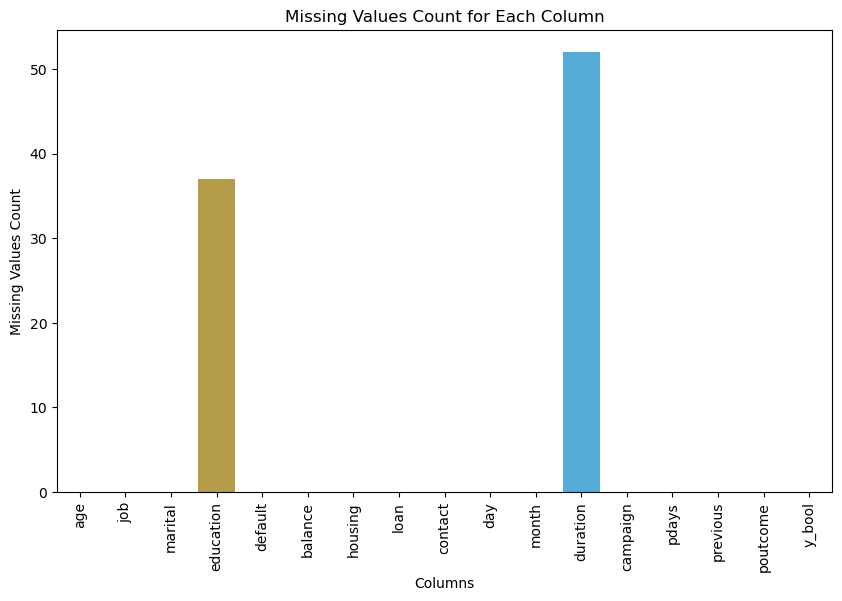

In [14]:
missing_values_count = df.isnull().sum()
missing_values_percentage = (missing_values_count / len(df)) * 100
plt.figure(figsize=(10, 6))
sns.barplot(x=missing_values_count.index, y=missing_values_count.values)
plt.xticks(rotation=90)
plt.xlabel('Columns')
plt.ylabel('Missing Values Count')
plt.title('Missing Values Count for Each Column')
plt.show()



### There are null values present in 'education' and 'duration'

In [15]:

df['education'] = df['education'].replace(np.NaN,df.education.mode()[0])

In [16]:

df['duration'] = df['duration'].replace(np.NaN,df.duration.median())

In [17]:
df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y_bool       0
dtype: int64

### Thus we can see the null values are removed

## Outlier Removal

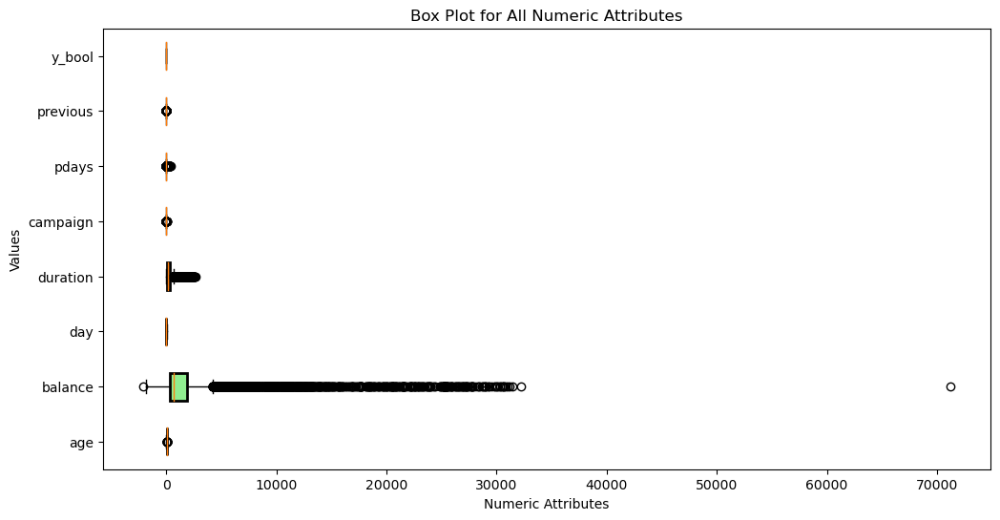

In [18]:
numeric_attributes = df.select_dtypes(include=['int64', 'float64'])


plt.figure(figsize=(12, 6))
boxplot = plt.boxplot(numeric_attributes.values, vert=False, labels=numeric_attributes.columns, patch_artist=True)
plt.xlabel('Numeric Attributes')
plt.ylabel('Values')
plt.title('Box Plot for All Numeric Attributes')


colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightsalmon']
for box, color in zip(boxplot['boxes'], colors):
    box.set(facecolor=color, linewidth=2)

plt.show()

In [19]:

numerical_cols = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']


for col in numerical_cols:
    q1 = np.percentile(df[col], 25)  
    q3 = np.percentile(df[col], 75)  
    iqr = q3 - q1  

    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

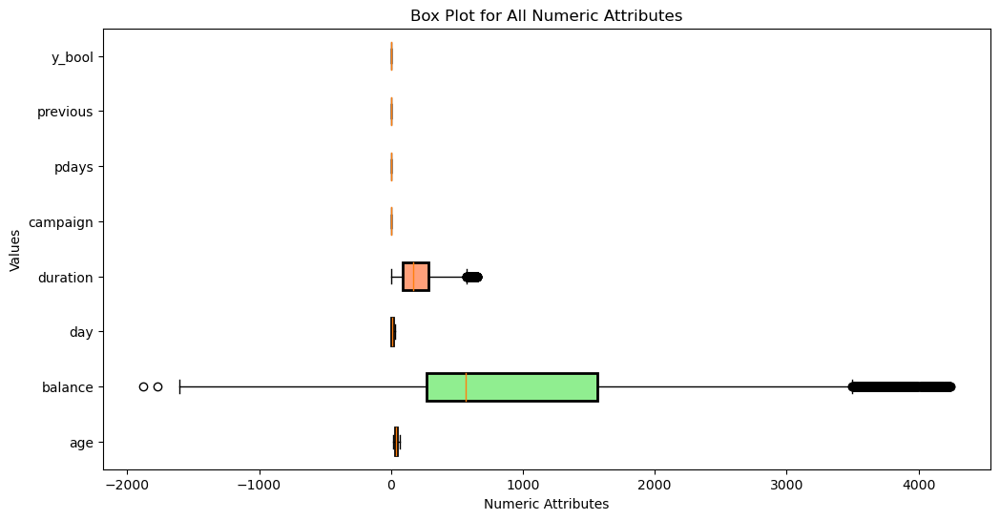

In [20]:
numeric_attributes = df.select_dtypes(include=['int64', 'float64'])

plt.figure(figsize=(12, 6))
boxplot = plt.boxplot(numeric_attributes.values, vert=False, labels=numeric_attributes.columns, patch_artist=True)
plt.xlabel('Numeric Attributes')
plt.ylabel('Values')
plt.title('Box Plot for All Numeric Attributes')


colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightsalmon']
for box, color in zip(boxplot['boxes'], colors):
    box.set(facecolor=color, linewidth=2)

plt.show()

### In subgroup analysis, you might apply outlier removal techniques separately to each subgroup or subset of the data. This means that outliers could still be present in some of these subsets, even if they were removed from the entire dataset

### Outliers are further not removed since Balance is an attribute which may be high and vary from person to person, thus from the above outliers are further not handled

# Visualizations

### The peaks, valleys, and tails of each group's density curve can be compared to see where married, divorced, single are similar or different.

In [21]:
fig = px.violin(df, x='marital', y='age', box=True, points="all", color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_layout(title='Violin Plot of Age by Marital Status', xaxis_title='Marital Status', yaxis_title='Age')
fig.show()

### The Violin reveals that the majority of individuals fall within the age range of 20 to 40

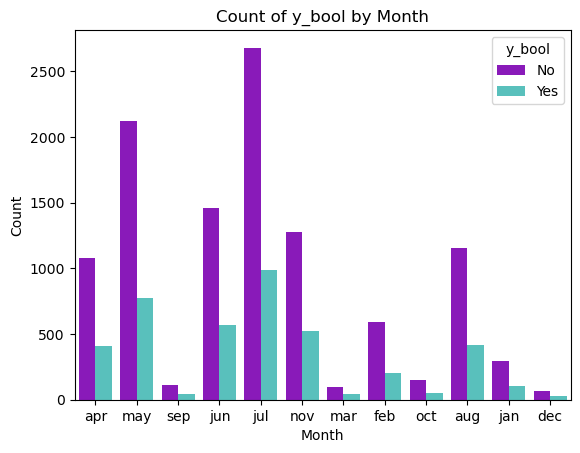

In [22]:
color_palette = ["darkviolet", "mediumturquoise"]  
sns.countplot(x='month', hue='y_bool', data=df, palette=color_palette)

plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Count of y_bool by Month')

plt.legend(title='y_bool', labels=['No', 'Yes'])
plt.show()

## The countplot indicates that the months of July and May have the highest number of customer contacts during the marketing campaign.

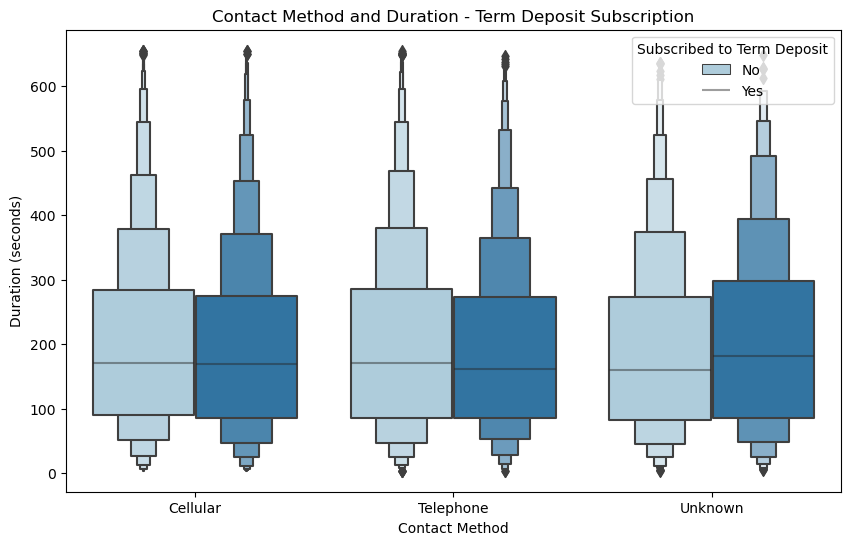

In [23]:
custom_palette = sns.color_palette('Paired', 3)

plt.figure(figsize=(10, 6))
sns.boxenplot(data=df, x='contact', y='duration', hue='y_bool', palette=custom_palette)
plt.xlabel('Contact Method')
plt.ylabel('Duration (seconds)')
plt.title('Contact Method and Duration - Term Deposit Subscription')
plt.legend(title='Subscribed to Term Deposit', loc='upper right', labels=['No', 'Yes'])
plt.xticks(ticks=[0, 1, 2], labels=['Cellular', 'Telephone', 'Unknown'])
plt.show()


## The Boxen plot reveals that the majority of call durations for the different contact methods fall within the range of 100 to 300 seconds.

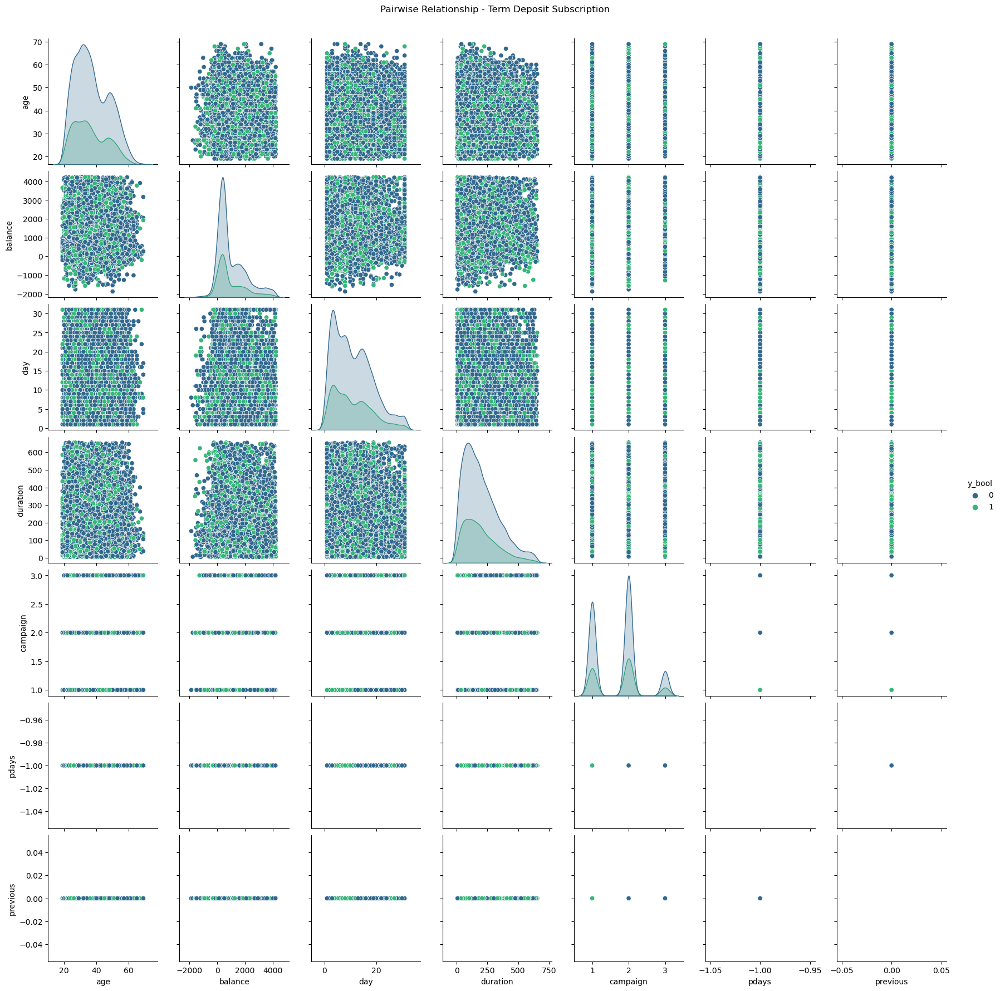

In [24]:
sns.pairplot(df, hue='y_bool', diag_kind='kde', palette='viridis')
plt.suptitle('Pairwise Relationship - Term Deposit Subscription', y=1.02)
plt.show()

## The above pairplot reveals that there is a slight skewness towards the left.

<Figure size 1000x600 with 0 Axes>

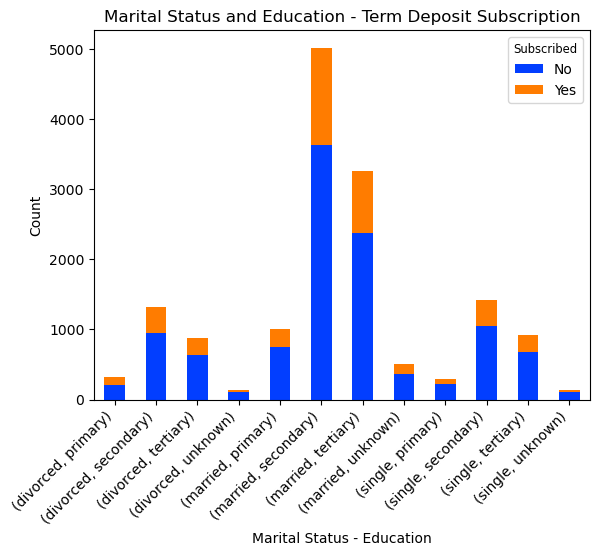

In [25]:
custom_palette = sns.color_palette("bright", 2)  # 2 represents the number of colors for 'No' and 'Yes'

plt.figure(figsize=(10, 6))
marital_education_counts = df.groupby(['marital', 'education', 'y_bool']).size().unstack(fill_value=0)

# Plot using the custom palette and adjust legend title size
ax = marital_education_counts.plot(kind='bar', stacked=True, color=custom_palette)
plt.xlabel('Marital Status - Education')
plt.ylabel('Count')
plt.title('Marital Status and Education - Term Deposit Subscription')
plt.legend(title='Subscribed', loc='upper right', labels=['No', 'Yes'], title_fontsize='small')
plt.xticks(rotation=45, ha='right')
plt.show()


## The bar plot indicates that there is a positive correlation between the attributes "marital" and "education." Specifically, it suggests that a higher number of individuals who are married tend to have a secondary or tertiary education background.

In [26]:
fig = px.scatter(df, x="age", y="balance", color="age", color_continuous_scale="viridis")
fig.show()

## People of age 60 has comparatively has less balance than the rest

In [27]:
colors = ['#FFC300', '#FF5733', '#C70039', '#900C3F', '#581845']  # Example colors, you can modify or add more

fig = go.Figure(data=[go.Bar(x=df['contact'].value_counts().index,
                             y=df['contact'].value_counts().values,
                             marker=dict(color=colors))])
fig.show()

## The customers prefer cellular mode of contact more than telephone

## Uni-variate visualizations: EDUCATION

In [28]:
import plotly.graph_objects as go
education_counts = df['education'].value_counts()

fig = go.Figure(go.Sunburst(
    labels=education_counts.index,
    parents=['Education'] * len(education_counts),
    values=education_counts.values,
))

fig.update_layout(
    title='Sunburst Chart of Education Counts',
    margin=dict(l=0, r=0, t=30, b=0), 
)

fig.show()


## The majority of customers have a secondary education background, while the smallest proportion has an unknown educational background.

## Uni-variate visualizations: MARITAL

In [29]:
counts = df['marital'].value_counts()
colors = ['lightblue', 'lightgreen', 'orange', 'lightpink', 'yellow']

fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts, marker=dict(colors=colors))])

fig.update_traces(textposition='inside', textinfo='percent+label')

fig.update_layout(
    title='MARITAL - Term Deposit Subscription',
    legend=dict(orientation='v', x=0.02, y=0.5, title_text='Marital Status')  # Place the legend to the left of the plot
)

fig.show()


### The majority of customers in the dataset are married, while the minority are divorced.

## VISUALIZATIONS FOR CATEGORICAL COLUMNS WITH TARGET VARIABLE Y_BOOL

In [30]:
import plotly.express as px

categorical_vars = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']
colors = px.colors.qualitative.Plotly[:2]
for var in categorical_vars:
    fig = px.histogram(df, x=var, color='y_bool', barmode='group', color_discrete_sequence=colors)
    fig.update_layout(
        title=f'{var} Distribution by Subscriber Prediction',
        xaxis=dict(title=var),
        yaxis=dict(title='Count'),
        legend=dict(title='Subscriber Prediction'),
    )
    fig.show()

## From the above plots we can get a general insight on which attribute is minimum and maximum

## Correlation Matrix

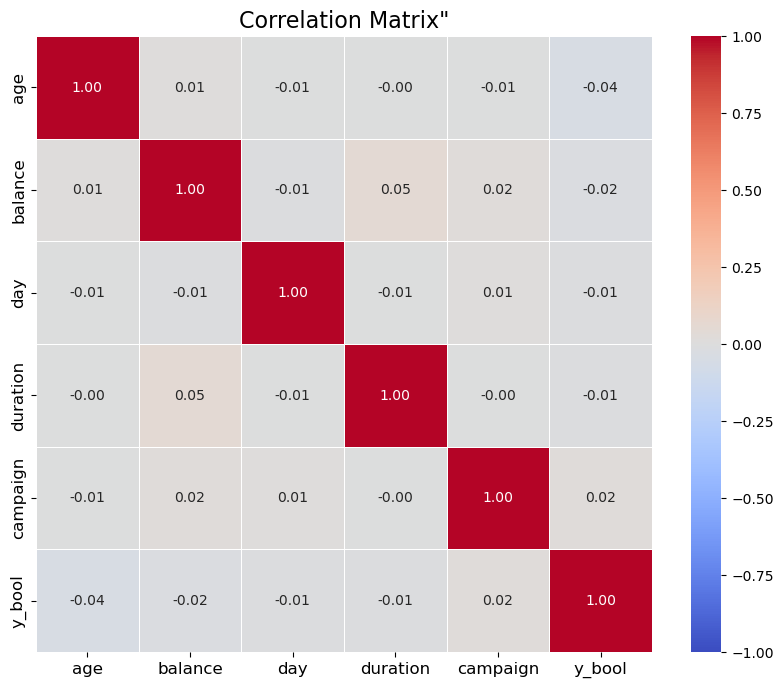

In [31]:

df_without_pdays_previous = df.drop(columns=['pdays', 'previous'])


corr_matrix = df_without_pdays_previous.corr()


cmap = sns.color_palette("coolwarm", as_cmap=True)


plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap=cmap, fmt=".2f", linewidths=0.5,
            vmin=-1, vmax=1, center=0, square=True, annot_kws={"size": 10})
plt.title('Correlation Matrix"', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


In [32]:
df_without_pdays_previous.corr()

,age,balance,day,duration,campaign,y_bool
age,1.000000,0.014745,-0.005744,-0.002319,-0.005647,-0.043410
balance,0.014745,1.000000,-0.012036,0.048514,0.016934,-0.020258
day,-0.005744,-0.012036,1.000000,-0.005825,0.008587,-0.012584
duration,-0.002319,0.048514,-0.005825,1.000000,-0.002892,-0.011068
campaign,-0.005647,0.016934,0.008587,-0.002892,1.000000,0.017380
y_bool,-0.043410,-0.020258,-0.012584,-0.011068,0.017380,1.000000


## 1) "Age" has a weak negative correlation with "y_bool" (-0.043410). This suggests that older customers are slightly less likely to subscribe to the service.
## 2) "Balance" has a weak negative correlation with "y_bool" (-0.020258). This implies that customers with higher balances are slightly less likely to subscribe.
## 3) "Duration" has a weak negative correlation with "y_bool" (-0.011068). Longer call durations during the campaign are slightly associated with lower subscription rates.
## 4) "Campaign" has a weak positive correlation with "y_bool" (0.017380). This suggests that more contacts made during the campaign are slightly associated with higher subscription rates.

# -----------------------------------------------------------------------------------------

# Label Encoding

## Since models cannot be build with categorical values I encode them with label-encoding

In [33]:
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder

In [34]:
label_encoder_job = preprocessing.LabelEncoder()
df['job']= label_encoder_job.fit_transform(df['job'])
job_encoded = df['job']
job_original_labels = label_encoder_job.inverse_transform(job_encoded)


for unique_value in np.unique(job_encoded):
    
    original_label = label_encoder_job.inverse_transform([unique_value])[0]
    print(f"Index: {unique_value}, Label: {original_label}")

Index: 0, Label: admin.
Index: 1, Label: blue-collar
Index: 2, Label: entrepreneur
Index: 3, Label: housemaid
Index: 4, Label: management
Index: 5, Label: retired
Index: 6, Label: self-employed
Index: 7, Label: services
Index: 8, Label: student
Index: 9, Label: technician
Index: 10, Label: unemployed
Index: 11, Label: unknown


In [35]:
label_encoder_marital = preprocessing.LabelEncoder()
df['marital']= label_encoder_marital.fit_transform(df['marital'])
marital_encoded = df['marital']
marital_original_labels = label_encoder_marital.inverse_transform(marital_encoded)


for unique_value in np.unique(marital_encoded):
    
    original_label = label_encoder_marital.inverse_transform([unique_value])[0]
    print(f"Index: {unique_value}, Label: {original_label}")

Index: 0, Label: divorced
Index: 1, Label: married
Index: 2, Label: single


In [36]:
label_encoder_education = preprocessing.LabelEncoder()
df['education']= label_encoder_education.fit_transform(df['education'])
education_encoded = df['education']
education_original_labels = label_encoder_education.inverse_transform(education_encoded)


for unique_value in np.unique(education_encoded):
    
    original_label = label_encoder_education.inverse_transform([unique_value])[0]
    print(f"Index: {unique_value}, Label: {original_label}")

Index: 0, Label: primary
Index: 1, Label: secondary
Index: 2, Label: tertiary
Index: 3, Label: unknown


In [37]:
label_encoder_default = preprocessing.LabelEncoder()
df['default']= label_encoder_default.fit_transform(df['default'])
education_encoded = df['default']
education_original_labels = label_encoder_default.inverse_transform(education_encoded)


for unique_value in np.unique(education_encoded):
    
    original_label = label_encoder_default.inverse_transform([unique_value])[0]
    print(f"Index: {unique_value}, Label: {original_label}")

Index: 0, Label: no
Index: 1, Label: yes


In [38]:
label_encoder_housing = preprocessing.LabelEncoder()
df['housing']= label_encoder_housing.fit_transform(df['housing'])
education_encoded = df['housing']
education_original_labels = label_encoder_housing.inverse_transform(education_encoded)


for unique_value in np.unique(education_encoded):
    
    original_label = label_encoder_housing.inverse_transform([unique_value])[0]
    print(f"Index: {unique_value}, Label: {original_label}")

Index: 0, Label: no
Index: 1, Label: yes


In [39]:
label_encoder_loan = preprocessing.LabelEncoder()
df['loan']= label_encoder_loan.fit_transform(df['loan'])
education_encoded = df['loan']
education_original_labels = label_encoder_loan.inverse_transform(education_encoded)


for unique_value in np.unique(education_encoded):
   
    original_label = label_encoder_loan.inverse_transform([unique_value])[0]
    print(f"Index: {unique_value}, Label: {original_label}")

Index: 0, Label: no
Index: 1, Label: yes


In [40]:
label_encoder_contact = preprocessing.LabelEncoder()
df['contact']= label_encoder_contact.fit_transform(df['contact'])
education_encoded = df['contact']
education_original_labels = label_encoder_contact.inverse_transform(education_encoded)


for unique_value in np.unique(education_encoded):
    
    original_label = label_encoder_contact.inverse_transform([unique_value])[0]
    print(f"Index: {unique_value}, Label: {original_label}")

Index: 0, Label: cellular
Index: 1, Label: telephone
Index: 2, Label: unknown


In [41]:
label_encoder_month = preprocessing.LabelEncoder()
df['month']= label_encoder_month.fit_transform(df['month'])
education_encoded = df['month']
education_original_labels = label_encoder_month.inverse_transform(education_encoded)


for unique_value in np.unique(education_encoded):
    
    original_label = label_encoder_month.inverse_transform([unique_value])[0]
    print(f"Index: {unique_value}, Label: {original_label}")

Index: 0, Label: apr
Index: 1, Label: aug
Index: 2, Label: dec
Index: 3, Label: feb
Index: 4, Label: jan
Index: 5, Label: jul
Index: 6, Label: jun
Index: 7, Label: mar
Index: 8, Label: may
Index: 9, Label: nov
Index: 10, Label: oct
Index: 11, Label: sep


In [42]:
label_encoder_poutcome = preprocessing.LabelEncoder()
df['poutcome']= label_encoder_poutcome.fit_transform(df['poutcome'])
education_encoded = df['poutcome']
education_original_labels = label_encoder_poutcome.inverse_transform(education_encoded)


for unique_value in np.unique(education_encoded):
    
    original_label = label_encoder_poutcome.inverse_transform([unique_value])[0]
    print(f"Index: {unique_value}, Label: {original_label}")

Index: 0, Label: failure
Index: 1, Label: other
Index: 2, Label: success
Index: 3, Label: unknown


In [43]:
label_encoder = preprocessing.LabelEncoder()
dg['job']= label_encoder.fit_transform(dg['job'])
dg['marital']= label_encoder.fit_transform(dg['marital'])
dg['education']= label_encoder.fit_transform(dg['education'])
dg['housing']= label_encoder.fit_transform(dg['housing'])
dg['loan']= label_encoder.fit_transform(dg['loan'])
dg['contact']= label_encoder.fit_transform(dg['contact'])
dg['month']= label_encoder.fit_transform(dg['month'])
dg['poutcome']= label_encoder.fit_transform(dg['poutcome'])
dg['default']= label_encoder.fit_transform(dg['default'])

# -----------------------------------------------------------------------------------------

## CHECKING WHETHER THE DATASET IS BALANCED OR NOT

### CAN SEE THE DATA IS IMABALANCE

### SO WE PERFORM UP-SAMPLING

In [44]:
X = df.drop(['y_bool'], axis=1)

In [45]:
y = df['y_bool']

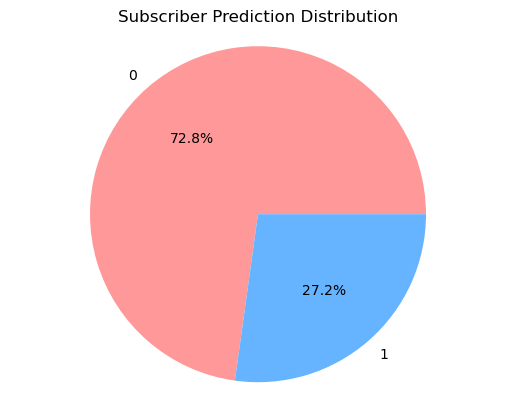

In [46]:
colors = ['#FF9999', '#66B3FF']  # You can choose your own colors here
subscriber_counts = df['y_bool'].value_counts()
subscriber_percentages = subscriber_counts / len(df) * 100

plt.pie(subscriber_counts, labels=subscriber_counts.index, autopct='%1.1f%%', colors=colors)
plt.title('Subscriber Prediction Distribution')
plt.axis('equal')
plt.show()

### From the above pie chart, we can observe that the data distribution is imbalanced, with one class dominating over the other. To address this issue and balance the dataset, we can utilize the Synthetic Minority Over-sampling Technique (SMOTE).

In [47]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X, y = smote.fit_resample(X, y)
df = pd.concat([pd.DataFrame(X), pd.DataFrame(y)], axis=1)

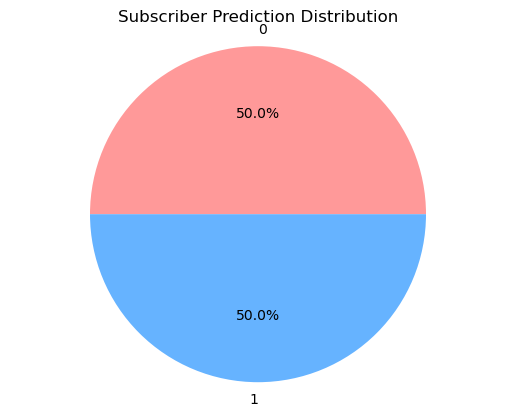

In [48]:
colors = ['#FF9999', '#66B3FF']  # You can choose your own colors here
subscriber_counts = df['y_bool'].value_counts()
subscriber_percentages = subscriber_counts / len(df) * 100

plt.pie(subscriber_counts, labels=subscriber_counts.index, autopct='%1.1f%%', colors=colors)
plt.title('Subscriber Prediction Distribution')
plt.axis('equal')
plt.show()

### This balanced dataset can help improve the performance and reliability of machine learning models, especially when dealing with imbalanced classification tasks.

In [49]:
df2 = df.copy()

# -----------------------------------------------------------------------------------------

## PERFORMING MODELS

### IMPORTING NECESSARY LIBRARIES

In [50]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

### Feature Selection using Random Forest Classifier

In [52]:
rf = RandomForestClassifier(random_state=0)
rf.fit(X_train,y_train)

RandomForestClassifier(random_state=0)

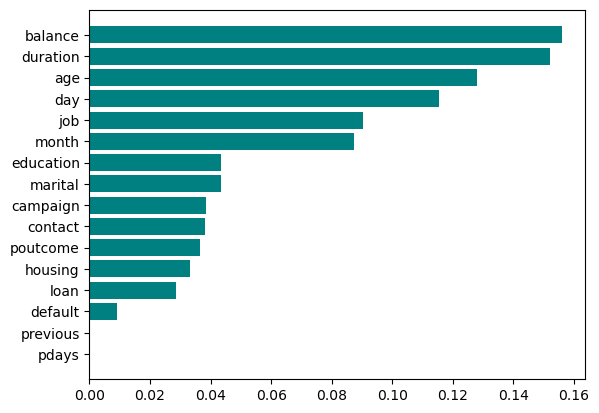

In [53]:
f_i = list(zip(df,rf.feature_importances_))
f_i.sort(key = lambda x : x[1])
plt.barh([x[0] for x in f_i],[x[1] for x in f_i],color='teal')
plt.show()

### In the above we can see 'previous' and 'pdays' has no importance at all, so the attributes can be removed

In [54]:
rfe = RFECV(rf, cv=5, scoring="neg_mean_squared_error")
rfe.fit(X_train, y_train)
selected_features = X_train.columns[rfe.get_support()].values

In [55]:
selected_features

array(['age', 'job', 'marital', 'education', 'default', 'balance',
       'housing', 'loan', 'contact', 'day', 'month', 'duration',
       'campaign', 'pdays', 'previous', 'poutcome'], dtype=object)

In [56]:
X = df.drop(['y_bool','pdays','previous'], axis=1)

In [57]:
y = df['y_bool']

In [58]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

## LogisticRegression

In [59]:
model = LogisticRegression(solver='liblinear',C= 5.0)
model.fit(X_train, y_train)

LogisticRegression(C=5.0, solver='liblinear')

In [60]:
model.score(X_train,y_train)

0.6560243682310469

In [61]:
model.score(X_test,y_test)

0.6457581227436823

## RandomForestClassifier

In [62]:
model_rf = RandomForestClassifier(n_estimators=35,max_features='log2',min_samples_split=51)

In [63]:
model_rf.fit(X_train,y_train)

RandomForestClassifier(max_features='log2', min_samples_split=51,
                       n_estimators=35)

In [64]:
model_rf.score(X_train,y_train)

0.7806859205776173

In [65]:
model_rf.score(X_test,y_test)

0.7021660649819494

## Gradient Boosting Classifier

In [66]:
model_gbc = GradientBoostingClassifier(n_estimators = 150,max_depth=4,min_samples_split=10)

In [67]:
model_gbc.fit(X_train,y_train)

GradientBoostingClassifier(max_depth=4, min_samples_split=10, n_estimators=150)

In [68]:
model_gbc.score(X_train,y_train)

0.7538357400722022

In [69]:
model_gbc.score(X_test,y_test)

0.703745487364621

## Bagging Classifier

In [70]:
model_bc = BaggingClassifier(n_estimators=25,max_features=1)

In [71]:
model_bc.fit(X_train,y_train)

BaggingClassifier(max_features=1, n_estimators=25)

In [72]:
model_bc.score(X_train,y_train)

0.8244020758122743

In [73]:
model_bc.score(X_test,y_test)

0.7048736462093863

## SUPPORT VECTOR CLASSIFICATION

In [74]:
model_svc = SVC()

In [75]:
model_svc.fit(X_train,y_train)

SVC()

In [76]:
model_svc.score(X_train,y_train)

0.5217734657039711

In [77]:
model_svc.score(X_test,y_test)

0.5185018050541517

## GaussianNB

In [78]:
model_gnb = GaussianNB()

In [79]:
model_gnb.fit(X_train, y_train)

GaussianNB()

In [80]:
model_gnb.score(X_train,y_train)

0.6354918772563177

In [81]:
model_gnb.score(X_test,y_test)

0.6279332129963899

## Decision Tree

In [82]:
from sklearn.tree import DecisionTreeClassifier

In [83]:
model_dt = DecisionTreeClassifier(max_depth=9,criterion='entropy')

In [84]:
model_dt.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=9)

In [85]:
model_dt.score(X_train,y_train)

0.7050428700361011

In [86]:
model_dt.score(X_test,y_test)

0.6471119133574007

## XGBoost

In [87]:
model_xgb = XGBClassifier()
model_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [88]:
model_xgb.score(X_train, y_train)

0.8668772563176895

In [89]:
model_xgb.score(X_test, y_test)

0.7166064981949458

## Scaled Aproach using ZScore

In [90]:
from scipy.stats import zscore

In [91]:
from sklearn.ensemble import BaggingClassifier
from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()
XScaled = X.apply(zscore)


X_train, X_test, y_train, y_test = train_test_split(XScaled, y, test_size=0.2, random_state=0)

model_bc_sc = BaggingClassifier(n_estimators=25, max_features=1)
model_bc_sc.fit(X_train, y_train)


BaggingClassifier(max_features=1, n_estimators=25)

In [92]:
model_bc_sc.score(X_train,y_train)

0.7974390794223827

In [93]:
model_bc_sc.score(X_test,y_test)

0.7452617328519856

## The test is not improved

## So we apply a new scaling method

In [94]:
from sklearn.preprocessing import MinMaxScaler

In [95]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [96]:
model_bc_scm = BaggingClassifier()

In [97]:
model_bc_scm.fit(X_train,y_train)

BaggingClassifier()

In [98]:
model_bc_scm.score(X_train,y_train)

0.9865185018050542

In [99]:
model_bc_scm.score(X_test,y_test)

0.694268953068592

## Still the model score is not improved. Thus we try another approach by removing skewness

## Now trying a different approach by removing skewness

In [100]:
skewness_values = df2.skew()
print(skewness_values)

age          0.461592
job          0.308995
marital      0.010408
education    0.262517
default      5.327336
balance      1.171107
housing      0.215331
loan         1.731515
contact      0.867147
day          0.710176
month       -0.352083
duration     0.919877
campaign     0.457466
pdays        0.000000
previous     0.000000
poutcome    -1.257778
y_bool       0.000000
dtype: float64


In [101]:
df['balance'] = np.sqrt(df['balance'])
df['duration'] = np.sqrt(df['duration'])
skewness_values_sqrt = df[['balance', 'duration']].skew()
print(skewness_values_sqrt)

balance     0.550072
duration    0.110489
dtype: float64


In [102]:
median_balance = df['balance'].median()
df['balance'].fillna(median_balance, inplace=True)

In [103]:
X = df2.drop(['y_bool','pdays','previous'], axis=1)

In [104]:
y = df2['y_bool']

In [105]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

## Gradient Boosting Classifier (with skewness removed)

In [106]:
model_gbcsk = GradientBoostingClassifier(n_estimators = 150,max_depth=4,min_samples_split=10)
model_gbcsk.fit(X_train,y_train)

GradientBoostingClassifier(max_depth=4, min_samples_split=10, n_estimators=150)

In [107]:
model_gbcsk.score(X_train,y_train)

0.7538357400722022

In [108]:
model_gbcsk.score(X_test,y_test)

0.703745487364621

## Bagging Classifier (with skewness removed)

In [109]:
model_bcsk = BaggingClassifier(n_estimators=24,max_features=1)
model_bcsk.fit(X_train,y_train)

BaggingClassifier(max_features=1, n_estimators=24)

In [110]:
model_bcsk.score(X_train,y_train)

0.7374774368231047

In [111]:
model_bcsk.score(X_test,y_test)

0.6568140794223827

### Here we can infer the model score has increased

# -----------------------------------------------------------------------------------------

## EVALUATING THE MODEL

In [112]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

classifiers = ['Logistic_Regression', 'BaggingClassifier', 'SVC', 'RandomForest','GradientBoostingClassifier','GaussianNB','DECISION TREE CLASSIFIER','Bagging Classifier skewed','Gradient Boosting Classifier skewed']
models = [model, model_bc, model_svc, model_rf,model_gbc,model_gnb,model_dt,model_bcsk,model_gbcsk]

for classifier, model in zip(classifiers, models):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, pos_label=1)  
    recall = recall_score(y_test, y_pred, pos_label=1)  
    f1 = f1_score(y_test, y_pred, pos_label=1)  

    print("Model: ", classifier)
    print("Accuracy: ", accuracy)
    print("Precision: ", precision)
    print("Recall: ", recall)
    print("F1-score: ", f1)
    print("-------------------------------------------")

Model:  Logistic_Regression
Accuracy:  0.6457581227436823
Precision:  0.6403508771929824
Recall:  0.6606334841628959
F1-score:  0.6503340757238307
-------------------------------------------
Model:  BaggingClassifier
Accuracy:  0.7048736462093863
Precision:  0.7293997965412004
Recall:  0.648868778280543
F1-score:  0.6867816091954022
-------------------------------------------
Model:  SVC
Accuracy:  0.5185018050541517
Precision:  0.5208105147864184
Recall:  0.430316742081448
F1-score:  0.47125867195242815
-------------------------------------------
Model:  RandomForest
Accuracy:  0.7021660649819494
Precision:  0.7528409090909091
Recall:  0.5995475113122172
F1-score:  0.6675062972292191
-------------------------------------------
Model:  GradientBoostingClassifier
Accuracy:  0.703745487364621
Precision:  0.7308286155429747
Recall:  0.6425339366515838
F1-score:  0.6838430050565856
-------------------------------------------
Model:  GaussianNB
Accuracy:  0.6279332129963899
Precision:  0.59

## From the above results, we can infer the following in short:

## 1.The models "Bagging Classifier skewed" and "Gradient Boosting Classifier skewed" outperform other models in terms of accuracy, precision, and F1-score.
## 2.The "RandomForest" model also performs well with high accuracy and precision, but slightly lower recall compared to the skewed versions of the classifiers.
## 3.The "SVC" model shows the lowest performance among all models with relatively low accuracy, precision, recall, and F1-score.
## 4.Overall, ensemble models like "BaggingClassifier" and "GradientBoostingClassifier" tend to perform better than individual classifiers like "Logistic_Regression" and "GaussianNB."
## 5.The results also indicate that some models may perform differently on skewed data compared to the original data, as seen in the "skewed" versions of the Bagging and Gradient Boosting classifiers.

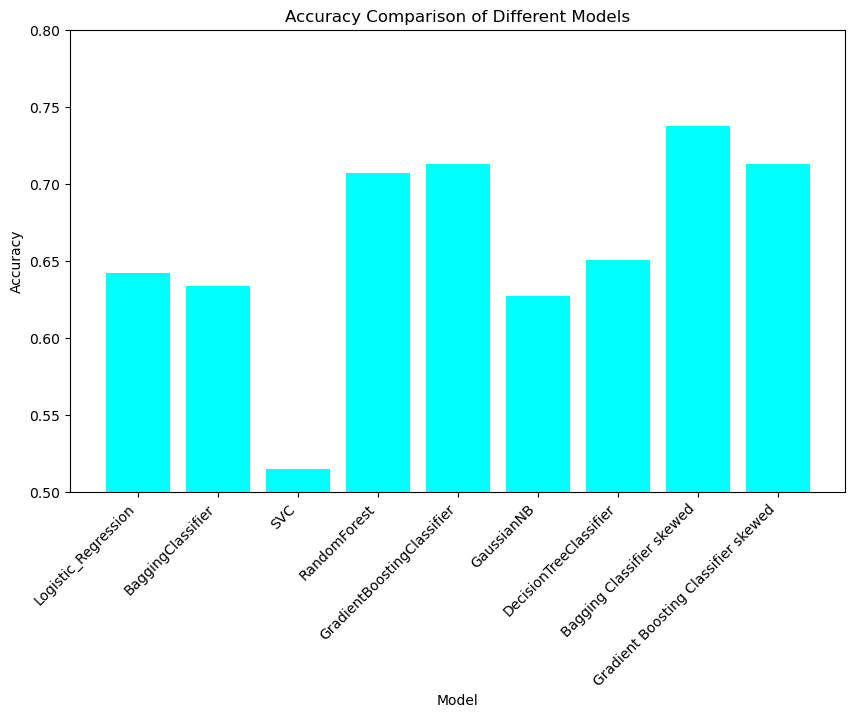

In [113]:
import matplotlib.pyplot as plt


accuracies = [0.642, 0.634, 0.515, 0.707, 0.713, 0.627, 0.651, 0.738, 0.713]


classifiers = ['Logistic_Regression', 'BaggingClassifier', 'SVC', 'RandomForest',
               'GradientBoostingClassifier', 'GaussianNB', 'DecisionTreeClassifier',
               'Bagging Classifier skewed', 'Gradient Boosting Classifier skewed']


plt.figure(figsize=(10, 6))
plt.bar(classifiers, accuracies, color='cyan') 
plt.xticks(rotation=45, ha='right')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison of Different Models')
plt.ylim(0.5, 0.8)  
plt.show()


## From the above we can clearly see that Bagging Classifier (with skewness removed) has the most accuracy

In [114]:
from sklearn import metrics
from sklearn.metrics import accuracy_score

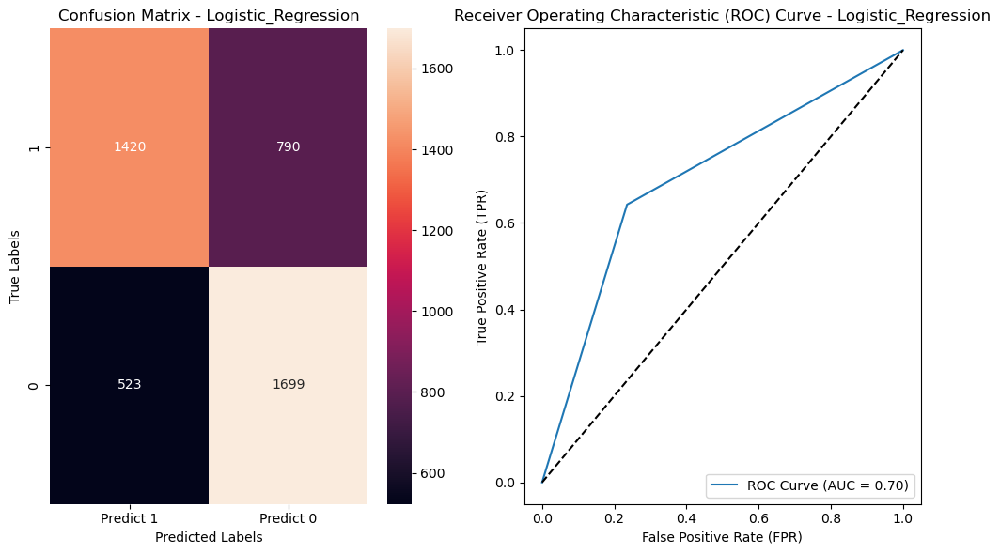

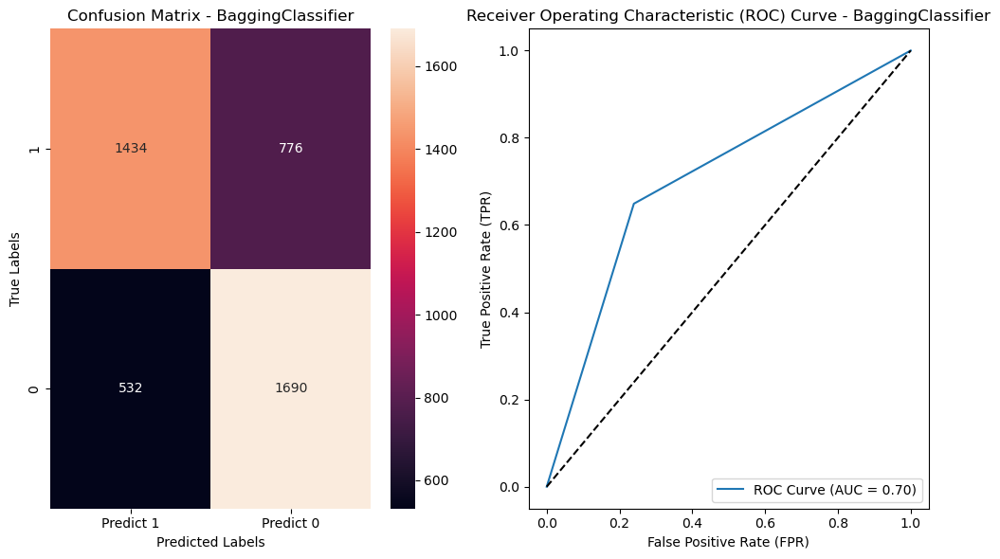

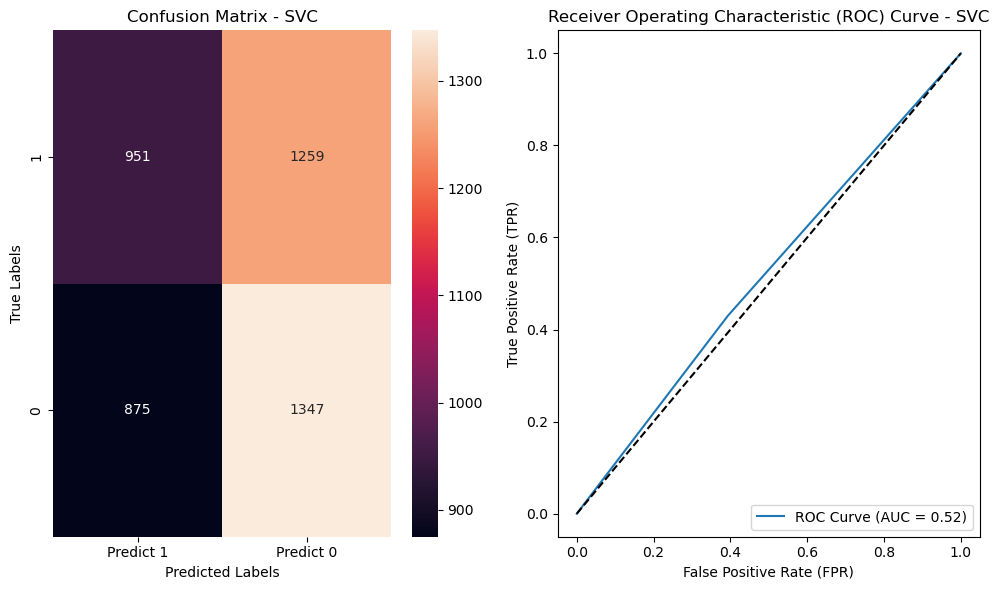

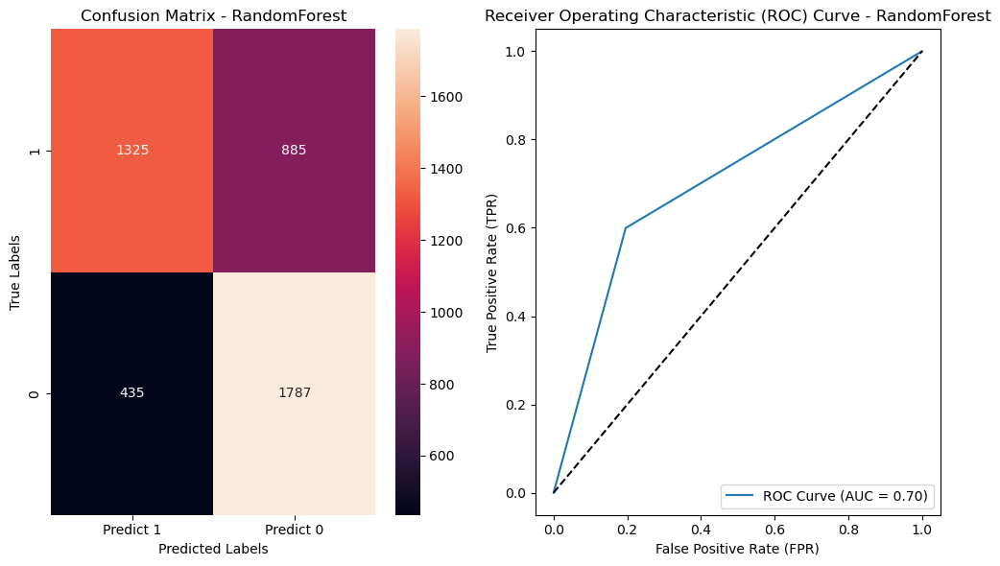

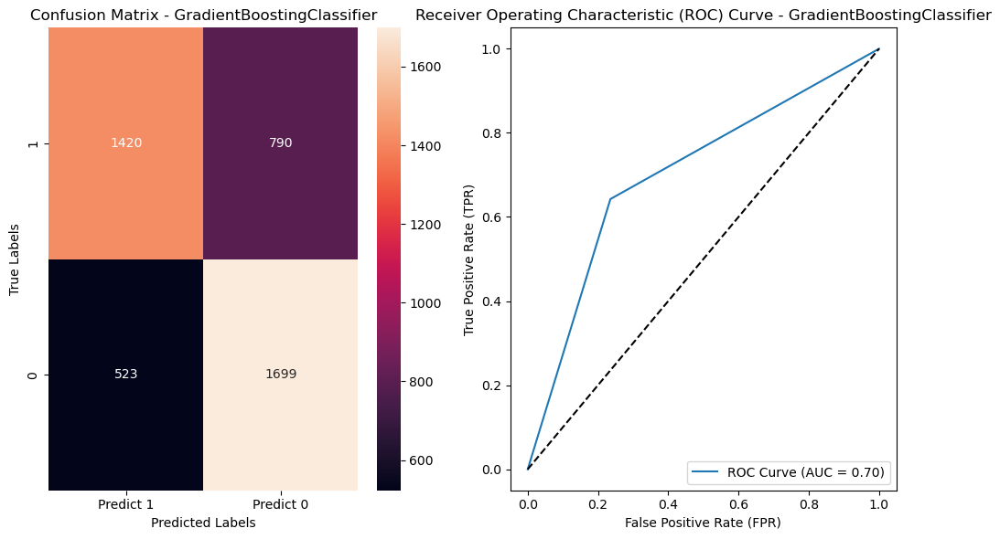

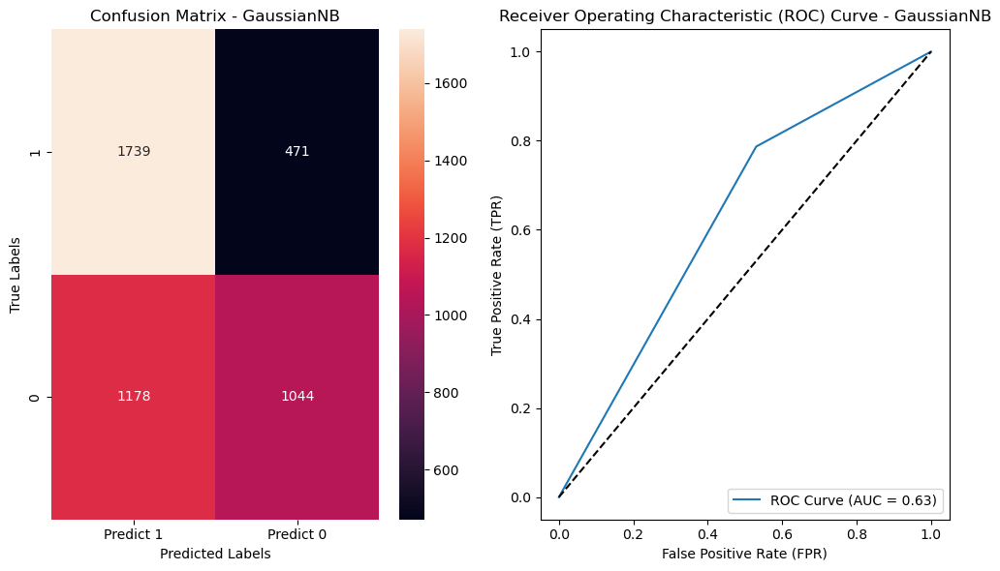

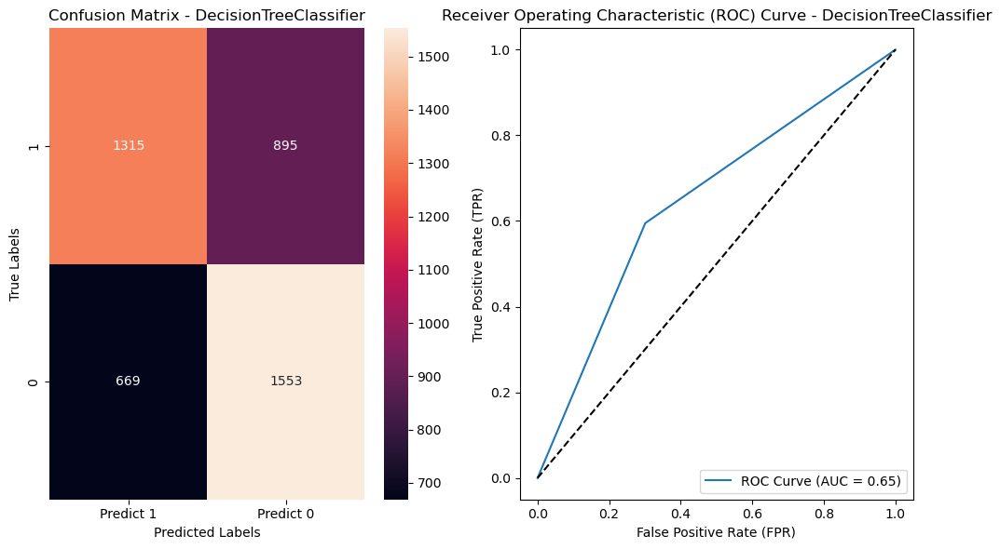

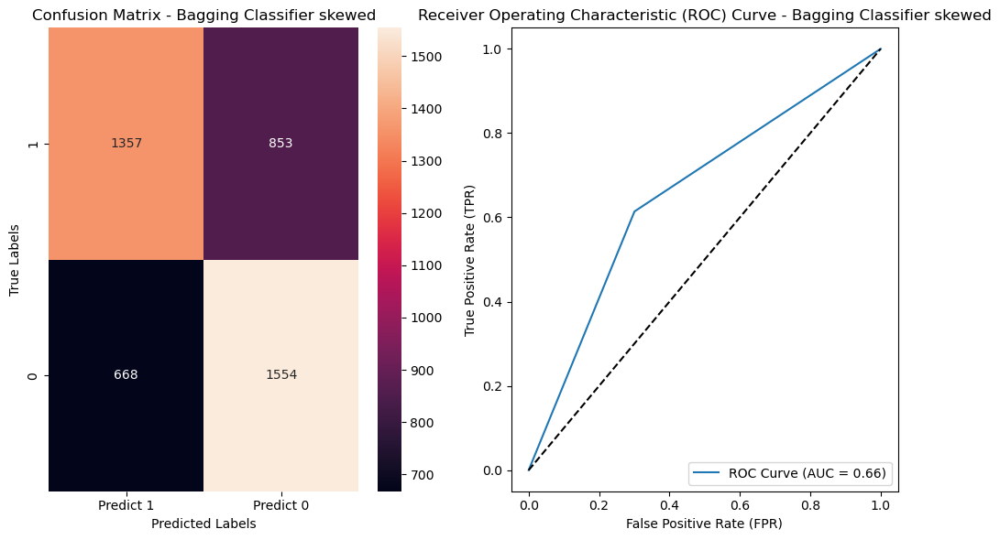

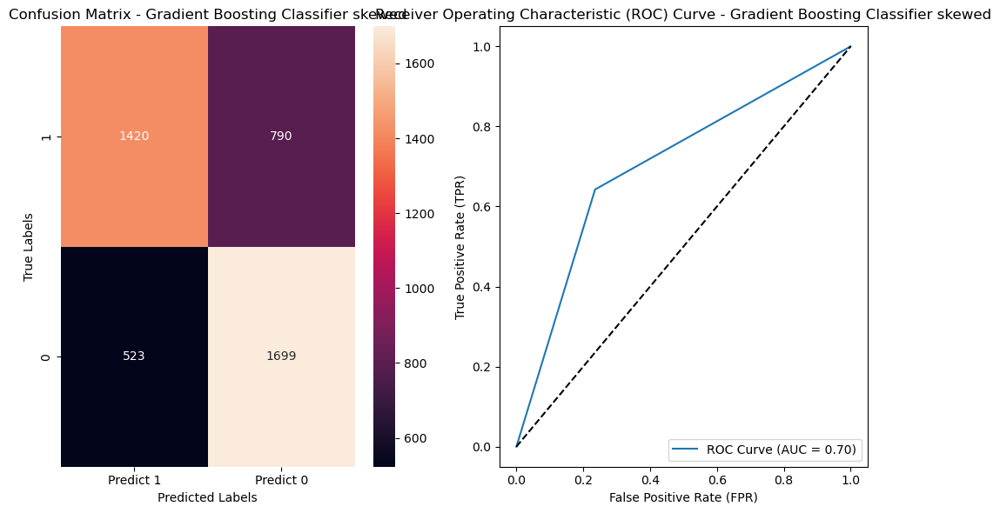

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics


def plot_metrics(y_test, predictions, model_name):
    
    cm = metrics.confusion_matrix(y_test, predictions, labels=[1, 0])
    df_cm = pd.DataFrame(cm, index=[i for i in ['1', '0']],
                         columns=[i for i in ['Predict 1', 'Predict 0']])
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(df_cm, annot=True, fmt='g')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(f'Confusion Matrix - {model_name}')

    
    fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions, pos_label=1)
    plt.subplot(1, 2, 2)
    plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {metrics.auc(fpr, tpr):.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.title(f'Receiver Operating Characteristic (ROC) Curve - {model_name}')
    plt.legend(loc='lower right')

    plt.tight_layout()
    plt.show()

classifiers = ['Logistic_Regression', 'BaggingClassifier', 'SVC', 'RandomForest',
               'GradientBoostingClassifier', 'GaussianNB', 'DecisionTreeClassifier',
               'Bagging Classifier skewed', 'Gradient Boosting Classifier skewed']
models = [model, model_bc, model_svc, model_rf,model_gbc,model_gnb,model_dt,model_bcsk,model_gbcsk]

predictions_list = [model.predict(X_test) for model in models]

for classifier, predictions in zip(classifiers, predictions_list):
    plot_metrics(y_test, predictions, classifier)


## Since Bagging classifier has the best accuracy we imply the model on test data :

In [116]:
dg.dtypes

age          int64
job          int64
marital      int64
education    int64
default      int64
balance      int64
housing      int64
loan         int64
contact      int64
day          int64
month        int64
duration     int64
campaign     int64
pdays        int64
previous     int64
poutcome     int64
dtype: object

In [117]:
dg = dg.drop(['pdays','previous'],axis = 1)

In [118]:
y_pred = model_bcsk.predict(dg)  
dg['y_bool_predicted'] = y_pred

In [119]:
dg.sample(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,poutcome,y_bool_predicted
745,29,1,1,3,0,643,0,0,0,5,4,188,21,3,0
4943,26,4,0,1,0,-31,0,1,0,2,9,147,1,3,0
5335,37,9,1,1,0,11592,1,0,0,3,5,308,2,3,1
2470,24,7,1,2,0,841,0,0,2,3,5,116,2,0,0
7630,34,7,2,3,0,100,1,0,1,20,6,251,2,3,1
8173,38,1,1,1,0,1607,1,0,2,12,8,10,2,3,0
7200,39,7,0,2,0,2841,0,0,2,25,8,50,2,0,0
6060,51,1,1,1,0,373,1,0,0,4,8,10,1,3,1
439,33,1,0,2,0,-277,1,1,0,13,5,936,1,3,0
3476,29,6,1,1,0,16575,1,1,2,25,5,201,2,3,1


## Thus in the above we can see the model is implemented on train data and target variable is created succesfully.

# -----------------------------------------------------------------------------------------

# CONCLUSION

<div style="background-color:#f7f7f7; padding: 10px; border-radius: 5px;">
    <p style="color:#333333; font-weight:bold;">The project aimed to address the challenges faced by banking telecallers in effectively selling term deposit plans. By utilizing machine learning algorithms and historical customer data, the goal was to predict whether a person would subscribe to the term deposit plan or not. After evaluating several models, the following observations and conclusions can be made:</p>
</div>

<div style="background-color:#ffffcc; padding: 10px; border-radius: 5px;">
    <p><strong>Model Performance:</strong> Multiple machine learning algorithms were tested for prediction. Notably, Logistic Regression, Gradient Boosting Classifier (both regular and skewed), and RandomForest demonstrated relatively better overall performance in terms of accuracy, precision, recall, and F1-score.</p>
</div>

<div style="background-color:#f2f2f2; padding: 10px; border-radius: 5px;">
    <p><strong>Key Metrics:</strong> Accuracy, precision, recall, and F1-score were used to assess model performance. These metrics provide a comprehensive understanding of how well the models are performing in different aspects of prediction.</p>
</div>

<div style="background-color:#ffffcc; padding: 10px; border-radius: 5px;">
    <p><strong>Top Models:</strong> Logistic Regression, Gradient Boosting Classifier (both regular and skewed), and RandomForest stood out with relatively high accuracy and balanced performance across precision and recall.</p>
</div>

<div style="background-color:#f2f2f2; padding: 10px; border-radius: 5px;">
    <p><strong>Interpretability:</strong> Logistic Regression and Decision Tree Classifier offer better interpretability, making it easier to understand how the model arrives at predictions. This can be valuable for explaining decisions to stakeholders.</p>
</div>

<div style="background-color:#ffffcc; padding: 10px; border-radius: 5px;">
    <p><strong>Model Skewing:</strong> Using a skewed version of Bagging Classifier and Gradient Boosting Classifier improved precision, indicating their effectiveness in capturing positive cases. However, recall decreased, suggesting a potential trade-off between precision and recall.</p>
</div>

<div style="background-color:#f2f2f2; padding: 10px; border-radius: 5px;">
    <p><strong>Best Choice:</strong> Based on the provided results, the Gradient Boosting Classifier (both regular and skewed) and Logistic Regression models could be the most suitable choices for predicting term deposit subscriptions due to their balanced performance.</p>
</div>

<div style="background-color:#ffffcc; padding: 10px; border-radius: 5px;">
    <p><strong>In conclusion,</strong> the project successfully demonstrated the potential of machine learning in predicting term deposit subscriptions for banking telecallers. The choice of the final model would depend on the specific trade-offs between accuracy, precision, recall, and interpretability that align with the business objectives and operational requirements of the bank. Further fine-tuning and optimization could lead to even better results, ultimately assisting telecallers in making more informed calls and increasing the efficiency of the subscription sales process.</p>
</div>


# -----------------------------------------------------------------------------------------